In [ ]:
import os
import tensorflow as tf
import tf_keras as keras

import matplotlib.pyplot as plt
from tqdm import tqdm
import numpy as np
import cv2

print(f"TensorFlow Version: {tf.__version__}")
print(f"Keras Version: {keras.__version__}")

2025-12-16 15:37:09.302338: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-12-16 15:37:09.350268: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI AVX512_BF16 AVX512_FP16 AVX_VNNI AMX_TILE AMX_INT8 AMX_BF16 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-12-16 15:37:10.499339: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


TensorFlow Version: 2.20.0
Keras Version: 2.20.1


In [2]:
PATH = '/home/ubuntu/fresh_start/Project/'
LOCAL_PATH = PATH + 'adversarial-attacks-deepfake_discovery/'
DIR_FAKE = PATH + "big_data_step1/fake/"
DIR_REAL = PATH + "big_data_step1/real/"
MODEL    = PATH + 'model/xception_faceforensics.h5'
N_IMGS = 10000 # number of images to load /!\ MEMORY
MULTI_THRESHOLD = False # try multiple thresholds on the final predictions to maybe get a better accuracy ?
ZOOM_FACTOR = 1.0 # how much to zoom in in each picture (zooming in doesn't provide better results)
LAPLACIAN_MIN = .05 # Minimum laplacian quality for an image to be loaded

In [3]:
!pwd

/home/ubuntu/fresh_start/Project/adversarial-attacks-deepfake_discovery


In [4]:
class FixedDepthwiseConv2D(keras.layers.DepthwiseConv2D):
    def __init__(self, **kwargs):
        # Nobuco added 'groups', we need to pop them
        if 'groups' in kwargs:
            kwargs.pop('groups')
        super().__init__(**kwargs)

print(f"Loading {MODEL} with custom patch...")

model = keras.models.load_model(
    MODEL,
    custom_objects={'DepthwiseConv2D': FixedDepthwiseConv2D}
)
loss_fn = tf.keras.losses.CategoricalCrossentropy(from_logits=True)

print("Model loaded successfully")
print(f"Input Shape: {model.input_shape}")

Loading /home/ubuntu/fresh_start/Project/model/xception_faceforensics.h5 with custom patch...


2025-12-16 15:37:12.374528: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


Model loaded successfully
Input Shape: (1, 299, 299, 3)


In [5]:
def softmax(x):
    e_x = np.exp(x - np.max(x))
    return e_x / e_x.sum()

def preprocess_image(img):
    if img is None: return None
    
    # BGR -> RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    img = cv2.resize(img, (299, 299))
    
    
    # [-1, 1]
    img = img.astype(np.float32) / 127.0 - 1.0
    
    # Batch dim -> (1, 299, 299, 3)
    img_tensor = tf.convert_to_tensor(img)
    img_tensor = tf.expand_dims(img_tensor, axis=0)
    
    return img_tensor

def get_laplacian_variance_score(img):
    if img is None:
        return 0.0

    # Convert to Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    laplacian_var = cv2.Laplacian(gray, cv2.CV_64F).var()

   
    threshold = 500 
    score = 1 / (1 + np.exp(-(laplacian_var - threshold) / 100))

    return score
    # return 1.0 # 

def zoom_center(img, zoom_factor=1.5):
    y_size, x_size, _ = img.shape

    crop_h = int(y_size / zoom_factor)
    crop_w = int(x_size / zoom_factor)
    
    y1 = int((y_size - crop_h) / 2)
    x1 = int((x_size - crop_w) / 2)
    y2 = y1 + crop_h
    x2 = x1 + crop_w
    
    # Crop
    img_cropped = img[y1:y2, x1:x2]

    img_zoomed = cv2.resize(img_cropped, (x_size, y_size), interpolation=cv2.INTER_LINEAR)
    
    return img_zoomed

def display_image(img):
    res = img[0]
    res = res + 1
    res = res / 2.0
    return res

In [6]:
# real_imgs = []
fake_imgs = []

# real_imgs_names = []
fake_imgs_names = []

"""
print("loading real imgs")
iter=0
for fname in tqdm(fnames_real[:N_IMGS], desc="Processing Real Images"):
    iter += 1
    path = os.path.join(DIR_REAL, fname)
    if 'jpg' not in path: continue
    img = cv2.imread(path)
    img = np.array(img)
    if img is not None and img.shape != ():
        img = zoom_center(img, ZOOM_FACTOR)
        if get_laplacian_variance_score(img) > LAPLACIAN_MIN:
            real_imgs.append(img)
        real_imgs_names.append(fname)
"""

print("loading fake imgs")
iter=0 
for fname in tqdm(os.listdir(DIR_FAKE)[:N_IMGS], desc="Processing Fake Images"):
    iter += 1
    path = os.path.join(DIR_FAKE, fname)
    if 'jpg' not in path: continue
    img = cv2.imread(path)
    img = np.array(img)
    if img is not None and img.shape != ():
        img = zoom_center(img, ZOOM_FACTOR)
        if get_laplacian_variance_score(img) > LAPLACIAN_MIN:
            fake_imgs.append(img)
    fake_imgs_names.append(fname)

print(f"\nSuccessfully loaded {len(fake_imgs)} fake images")
min_len = min(len(fake_imgs), N_IMGS)
print("Keeping the", min_len, "first images of each dataset")

fake_imgs = fake_imgs[:min_len]

if any(img is None for img in fake_imgs):
    print("Error, None detected. One or more images failed to load.")

loading fake imgs


Processing Fake Images: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:14<00:00, 681.75it/s]


Successfully loaded 1632 fake images
Keeping the 1632 first images of each dataset


<hr>

## Performance de l'UAP

In [7]:
pert1 = np.load(LOCAL_PATH + 'UAPs/uap-pgd_delta=0.06_eps=0.02_max-iter=50_a=0.001_k=100_N-imgs=5000.npy')[0]
print("loaded the perturbation with a shape of", pert1.shape)

loaded the perturbation with a shape of (299, 299, 3)


In [8]:
image_input = preprocess_image(fake_imgs[11])
pert_image  = image_input + pert1

image_input_pred = softmax(model.predict(image_input, verbose=0)[0])[1]
pert_image_pred = softmax(model.predict(image_input + pert1, verbose=0)[0])[1]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.011811018..1.003937].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.6391513597463785..2.6959401834071697].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.023593247..1.066113].


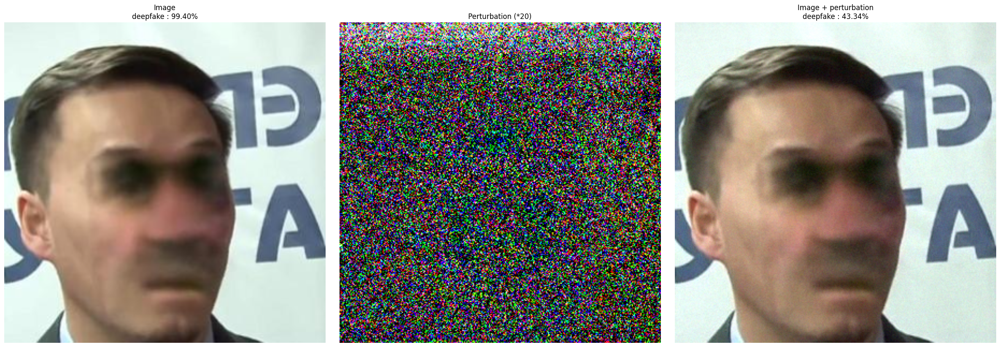

In [9]:
augmentation = 20

# afficher la perturbation
fig, a = plt.subplots(1,3,figsize=(24,8))
a.flatten()
a[0].imshow(display_image(image_input))
a[0].set_title(f'Image\ndeepfake : {image_input_pred*100:.2f}%')
a[0].axis('off')
a[1].imshow((pert1*augmentation))
a[1].set_title(f'Perturbation (*{augmentation})')
a[1].axis('off')
a[2].imshow(display_image(pert_image))
a[2].set_title(f'Image + perturbation\ndeepfake : {pert_image_pred*100:.2f}%')
a[2].axis('off')
plt.tight_layout()
plt.show()

In [13]:
probas_real = []
for img in tqdm(fake_imgs, desc=f'predicting'):
    image_input = preprocess_image(img)
    pert_image_pred = softmax(model.predict(image_input, verbose=0)[0])[1]
    probas_real.append(pert_image_pred)
fooling_rate=0
for i in probas:
    if i < .5:
        fooling_rate+=1
print(f"Fooling rate (real dataset) on {len(probas_real)} images: {fooling_rate/len(probas_real)*100:.2f}%")

predicting: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1632/1632 [04:53<00:00,  5.56it/s]

Fooling rate (real dataset) on 1632 images: 97.24%


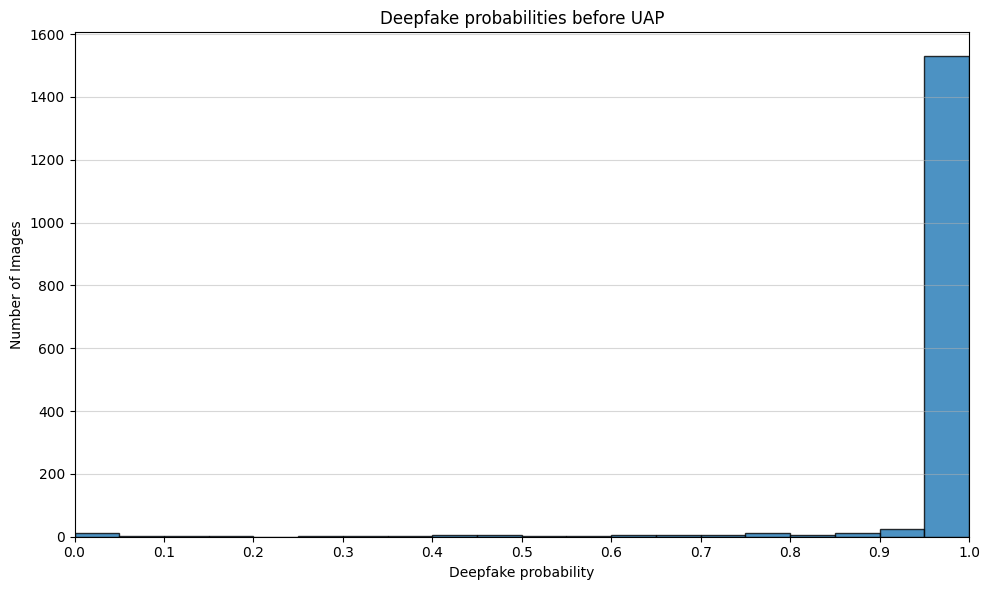

In [14]:
bins = 20
data_range = (0, 1)

plt.figure(figsize=(10, 6))

plt.hist(
    probas_real,
    bins=bins,
    range=data_range,
    edgecolor='black',
    alpha=0.8
)

plt.title('Deepfake probabilities before UAP')
plt.xlabel(r'Deepfake probability')
plt.ylabel('Number of Images')

# Set x-axis limits and ticks
plt.xlim(data_range)
plt.xticks(np.arange(0, 1.1, 0.1))

# Improve the plot appearance
plt.grid(axis='y', alpha=0.5)
plt.tight_layout()

### Essayer la perturbation sur les images du dataset

In [10]:
probas = []
for img in tqdm(fake_imgs, desc=f'predicting'):
    image_input = preprocess_image(img)
    pert_image  = image_input + pert1
    pert_image_pred = softmax(model.predict(image_input + pert1, verbose=0)[0])[1]
    probas.append(pert_image_pred)
fooling_rate=0
for i in probas:
    if i < .5:
        fooling_rate+=1
print(f"Fooling rate on {len(probas)} images: {fooling_rate/len(probas)*100:.2f}")

predicting: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1632/1632 [09:02<00:00,  3.01it/s]

Fooling rate on 1632 images: 97.24


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05805576..1.0160818].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05953151..1.0226777].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05805576..1.0344887].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05953151..1.048104].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05953151..1.0439298].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05953151..1.0453794].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0

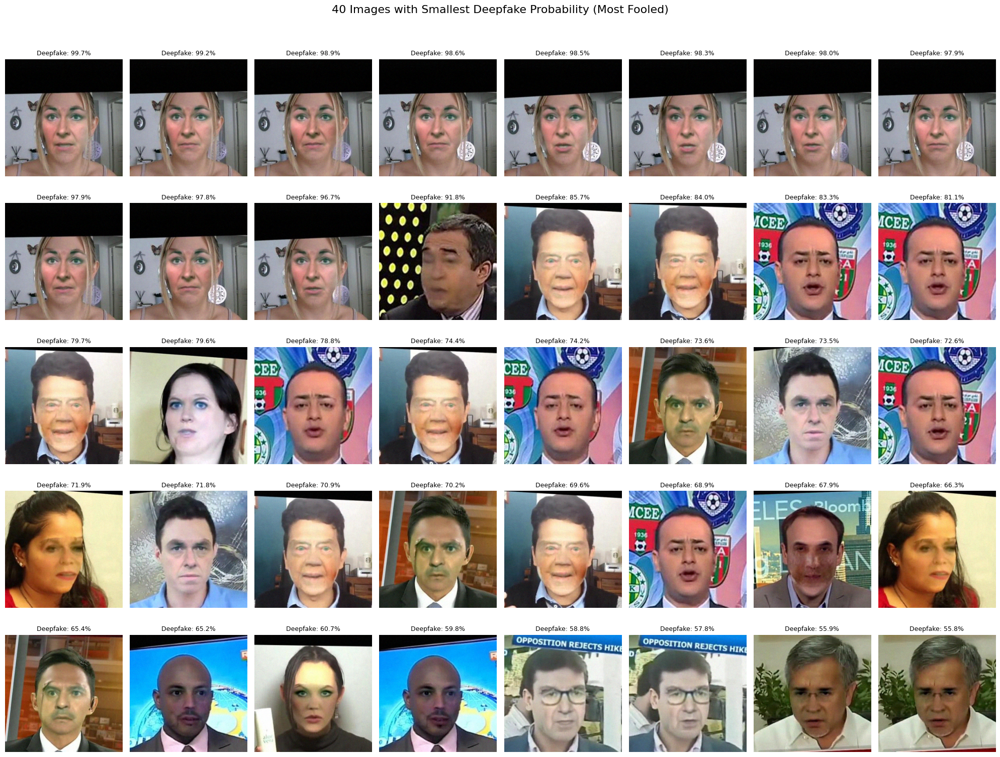

In [11]:
probas_array = np.array(probas)

sorted_indices = np.argsort(probas_array)
highest_prob_indices = sorted_indices[::-1]
num_to_display = 40
top = highest_prob_indices[:num_to_display]
selected_imgs = [fake_imgs[i] for i in top]
selected_probas = probas_array[top]


cols = 8
rows = 5
fig, axes = plt.subplots(rows, cols, figsize=(2.5 * cols, 3 * rows))
axes = axes.flatten()

for i in range(num_to_display):
    original_img = selected_imgs[i]
    pred_proba = selected_probas[i]
    
    image_input = preprocess_image(original_img)
    
    pert_image = image_input + pert1
    
    displayable_img = display_image(pert_image)
    
    axes[i].imshow(displayable_img)
    
    axes[i].set_title(f'Deepfake: {pred_proba*100:.1f}%', fontsize=9)
    axes[i].axis('off')

plt.suptitle(f'{num_to_display} Images with Smallest Deepfake Probability (Most Fooled)', y=1.02, fontsize=16)
plt.tight_layout()
plt.show()

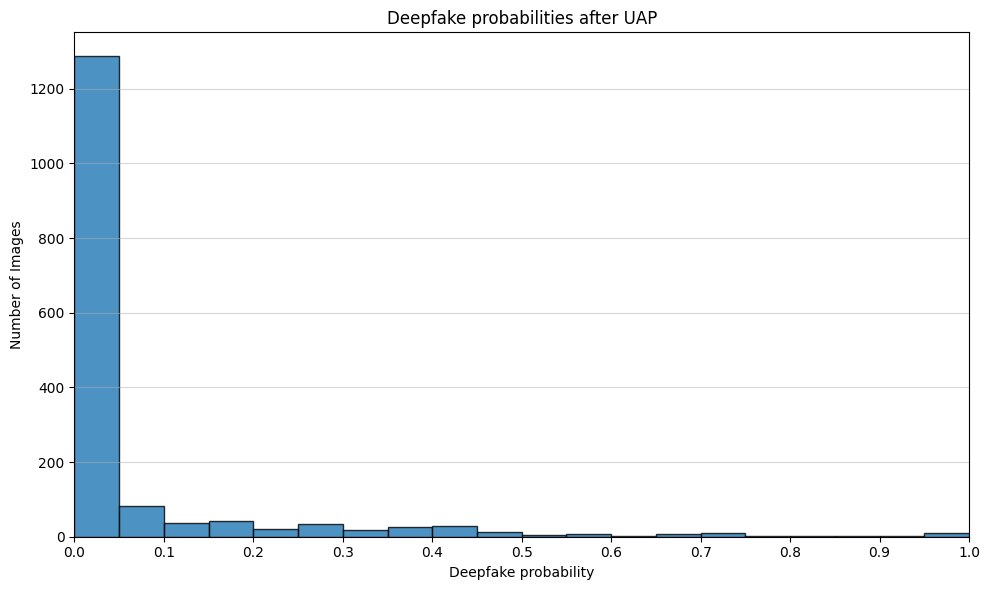

In [12]:
bins = 20
data_range = (0, 1)

plt.figure(figsize=(10, 6))

plt.hist(
    probas_array,
    bins=bins,
    range=data_range,
    edgecolor='black',
    alpha=0.8
)

plt.title('Deepfake probabilities after UAP')
plt.xlabel(r'Deepfake probability')
plt.ylabel('Number of Images')

# Set x-axis limits and ticks
plt.xlim(data_range)
plt.xticks(np.arange(0, 1.1, 0.1))

# Improve the plot appearance
plt.grid(axis='y', alpha=0.5)
plt.tight_layout()

In [15]:
# Find the average similarity score
similarities = []
for img in tqdm(fake_imgs, desc=f'computing avg similarity score'):
    image_input = preprocess_image(img)
    pert_image  = image_input + pert1
    try:
        similarities.append(tf.image.ssim_multiscale(image_input, pert_image, max_val=1.0))
    except Exception as e:
        print(f"input shape: {image_input.shape}\t output shape: {pert_image.shape}")


computing avg similarity score: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1632/1632 [01:47<00:00, 15.12it/s]


In [16]:
def avg(l):
    s = 0
    for i in l:
        s+=i
    return s/len(l)

In [17]:
def med(l):
    n = len(l)
    if n == 0:
        return None
    l_sorted = sorted(l)
    if n % 2 != 0:
        return l_sorted[n // 2]
    else:
        return (l_sorted[n // 2 - 1] + l_sorted[n // 2]) / 2

In [18]:
print('min', min(similarities)[0])
print('med', med(similarities)[0])
print('avg', avg(similarities)[0])
print('max', max(similarities)[0])

min tf.Tensor(0.92887324, shape=(), dtype=float32)
med tf.Tensor(0.96441233, shape=(), dtype=float32)
avg tf.Tensor(0.9644073, shape=(), dtype=float32)
max tf.Tensor(0.987783, shape=(), dtype=float32)


In [19]:
id_img = None
sim = None

target = avg(similarities)[0]
distance = 0.0001
for i, prob in enumerate(similarities):
    if prob - target < distance and target - prob < distance:
        id_img = i
        sim = prob
        break

print(f'image n°{id_img} has a similarity score of {sim}')

image n°30 has a similarity score of [0.9643374]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.003937].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.6391513597463785..2.6959401834071697].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0572744..1.0342686].


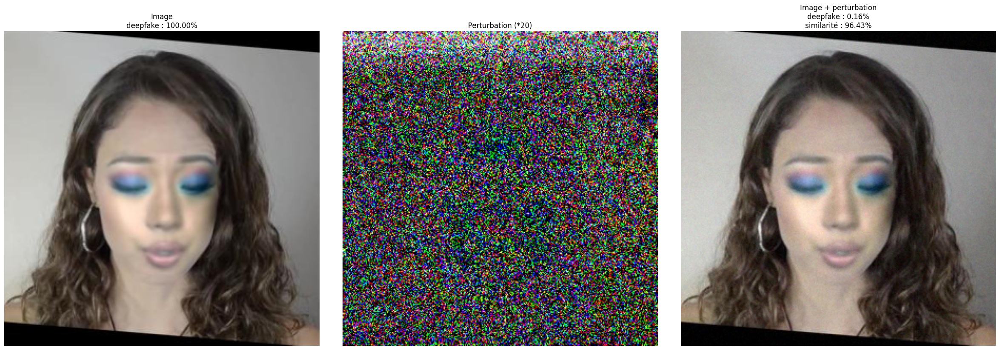

In [20]:
# plot an image that has rougthly the same similarity score
image_input = preprocess_image(fake_imgs[id_img])
pert_image  = image_input + pert1

image_input_pred = softmax(model.predict(image_input, verbose=0)[0])[1]
pert_image_pred = softmax(model.predict(image_input + pert1, verbose=0)[0])[1]

augmentation = 20

# afficher la perturbation
fig, a = plt.subplots(1,3,figsize=(24,8))
a.flatten()
a[0].imshow(display_image(image_input))
a[0].set_title(f'Image\ndeepfake : {image_input_pred*100:.2f}%')
a[0].axis('off')
a[1].imshow((pert1*augmentation))
a[1].set_title(f'Perturbation (*{augmentation})')
a[1].axis('off')
a[2].imshow(display_image(pert_image))
a[2].set_title(f'Image + perturbation\ndeepfake : {pert_image_pred*100:.2f}%\nsimilarité : {sim[0] * 100:.2f}%')
a[2].axis('off')
plt.tight_layout()
plt.show()